In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cardiovascular-disease-dataset/cardio_train.csv


In [2]:
df = pd.read_csv("/kaggle/input/cardiovascular-disease-dataset/cardio_train.csv", sep=";")
df.index

RangeIndex(start=0, stop=70000, step=1)

In [3]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [4]:
unique_counts = df.nunique()
print(unique_counts)


id             70000
age             8076
gender             2
height           109
weight           287
ap_hi            153
ap_lo            157
cholesterol        3
gluc               3
smoke              2
alco               2
active             2
cardio             2
dtype: int64


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [6]:
df.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [7]:
df.shape

(70000, 13)

In [8]:
df.isnull().sum()

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

This dataset provides some key features that could help in predicting cardiovascular disease (represented by the cardio column). However, there are clear indications that data cleaning and preprocessing steps are essential before building any predictive model. 

* Age: The age variable seems reasonable, but it’s recorded in days rather than years, which might need transformation for better interpretability.

* Blood Pressure (ap_hi and ap_lo): There are extreme outliers and possible data entry errors here:
Negative values in ap_hi (systolic blood pressure) and ap_lo (diastolic blood pressure) are unrealistic.
The maximum values (16020 for ap_hi and 11000 for ap_lo) are extremely high and need to be treated as outliers or errors.
* Height and Weight: The range of values for height (from 55 to 250 cm) and weight (from 10 to 200 kg) suggests possible errors or outliers.
Heights below 100 cm or above 250 cm and weights below 30 kg or over 200 kg could be flagged as potential outliers.


* Target Variable (cardio): This binary variable is the target for predicting cardiovascular disease. Balancing the classes (if they’re imbalanced) could improve model performance.

* Other Possible Cleaning Needs:

- Missing values: Though not shown in the summary, you should verify if any data points are missing.
- Scaling: Variables like height, weight, and blood pressure could benefit from scaling for certain models.

In [9]:
df = df.drop_duplicates()


# Data Transformation

In [10]:
df['age'] = round(df['age'] / 365.25, 2)


In [11]:
df['age'] = df['age'].astype(int)

In [12]:
print(df['age'].head())
print(df['age'].unique())

0    50
1    55
2    51
3    48
4    47
Name: age, dtype: int64
[50 55 51 48 47 60 61 54 40 39 45 58 59 63 64 53 49 57 56 46 43 62 52 42
 41 44 29 30]


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


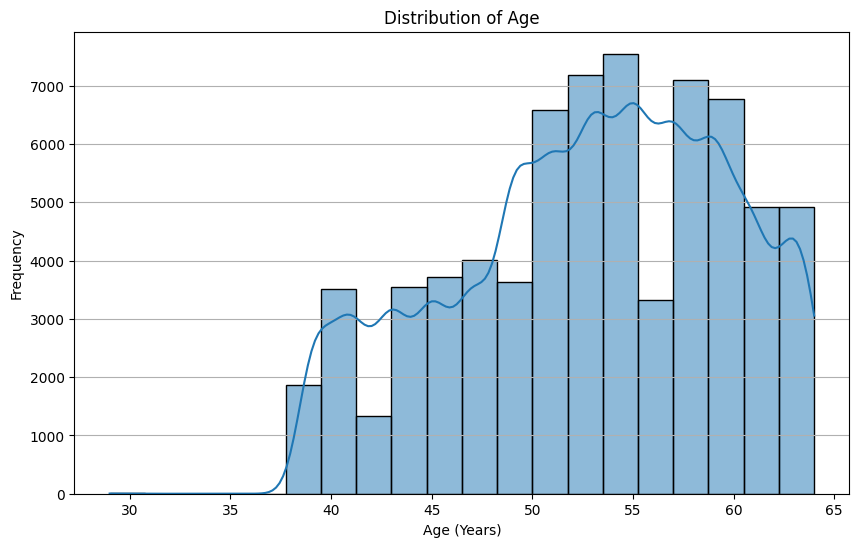

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='age', bins=20, kde=True)  
plt.title('Distribution of Age')
plt.xlabel('Age (Years)')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()


Cardio Distribution (Target Variable)

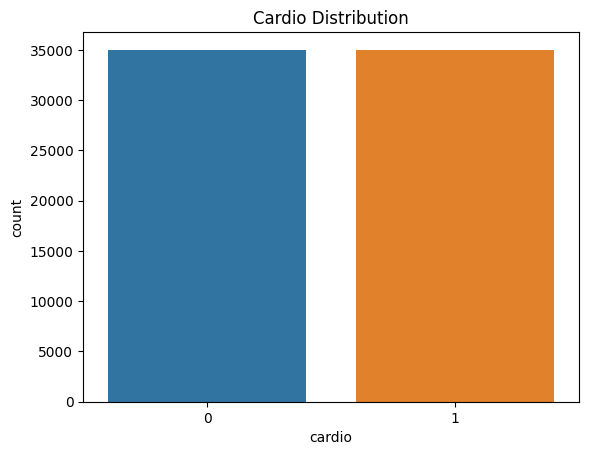

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.countplot(x='cardio', data=df)
plt.title('Cardio Distribution')
plt.show()



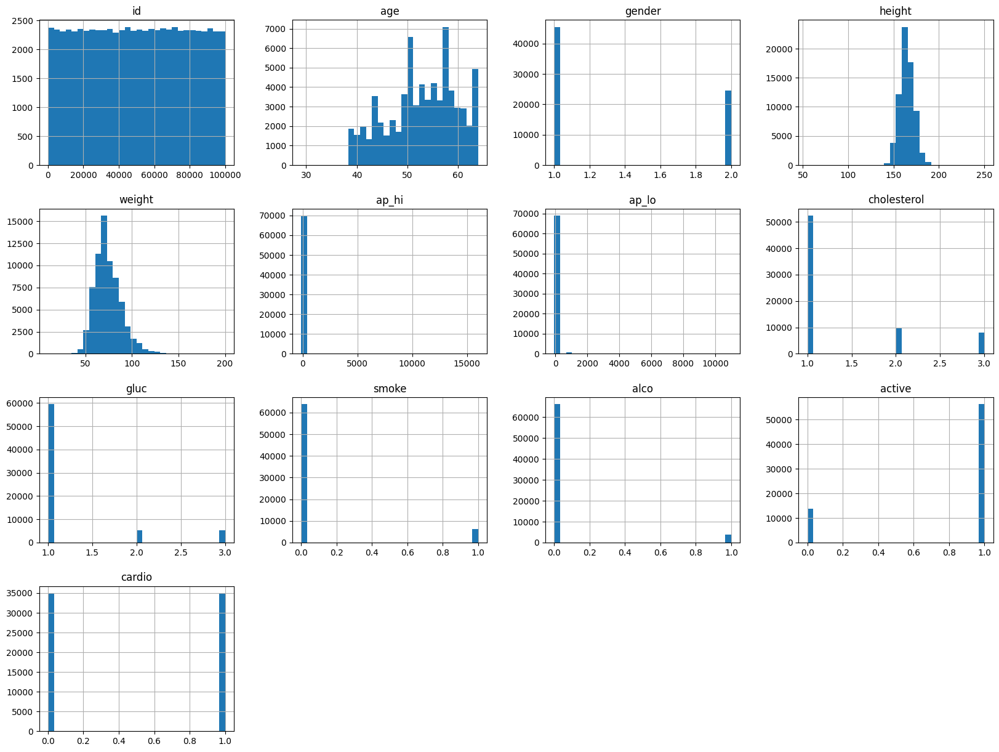

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
df.hist(bins=30, figsize=(20, 15))
plt.show()


Outliers Detection

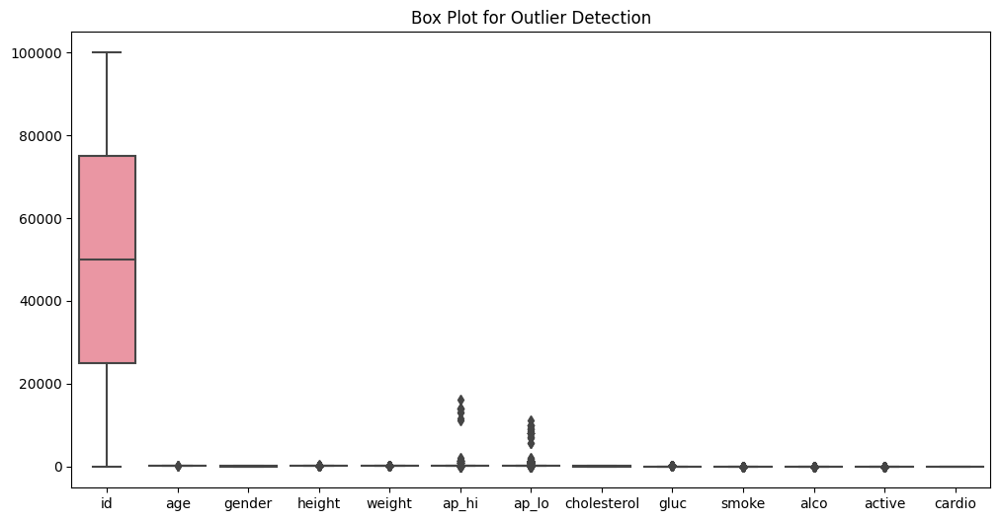

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.title('Box Plot for Outlier Detection')
plt.show()

The above boxplots confirm our suspicion that there are outliers in the dataset. There appear to be several outliers in the systolic and diastolic variables (ap_hi and ap_lo). These outliers might be explained by human error when entering data into the .csv format. Our prediction model might benefit if these outliers were removed from the data.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

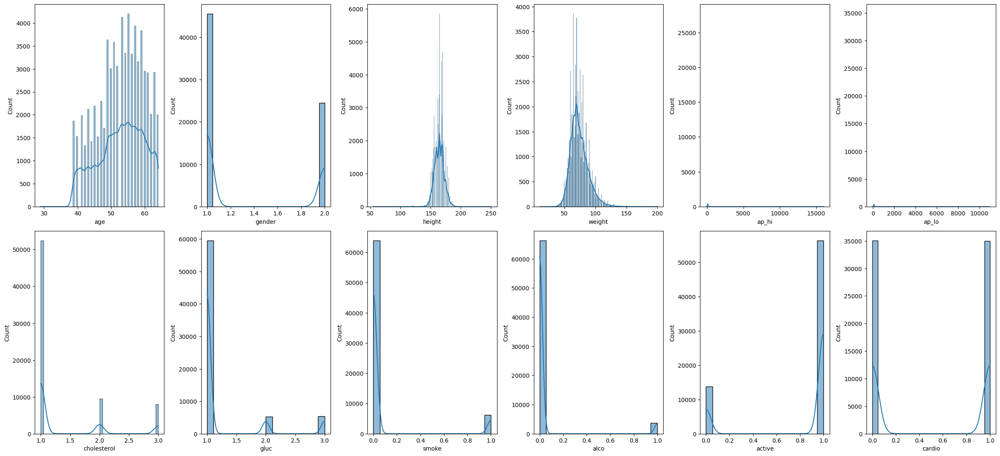

In [17]:
import math


def check_dist(df):
    l = df.columns.values
    number_of_columns = math.ceil((len(l) - 1) / 2)  # Ensure an integer value
    number_of_rows = 2
    
    plt.figure(figsize=(4 * number_of_columns, 8 * number_of_rows))
    for i in range(1, len(l)):
        plt.subplot(number_of_rows + 1, number_of_columns, i)
        sns.histplot(df[l[i]], kde=True)
        plt.tight_layout()

check_dist(df)



Histograms show the distribution of each feature in the dataset. There appears to be some variation in age, but height and weight are roughly normally distributed. However, the histograms further suggest the presence of outliers in the blood pressure features. Moreover, there exist categorical features in the dataset, such as gender, cholesterol, glucose, smoking habits, alcohol use, and activity.

In [18]:
df = df[(df['ap_hi'] >= 90) & (df['ap_hi'] <= 200)]
df = df[(df['ap_lo'] >= 60) & (df['ap_lo'] <= 120)]


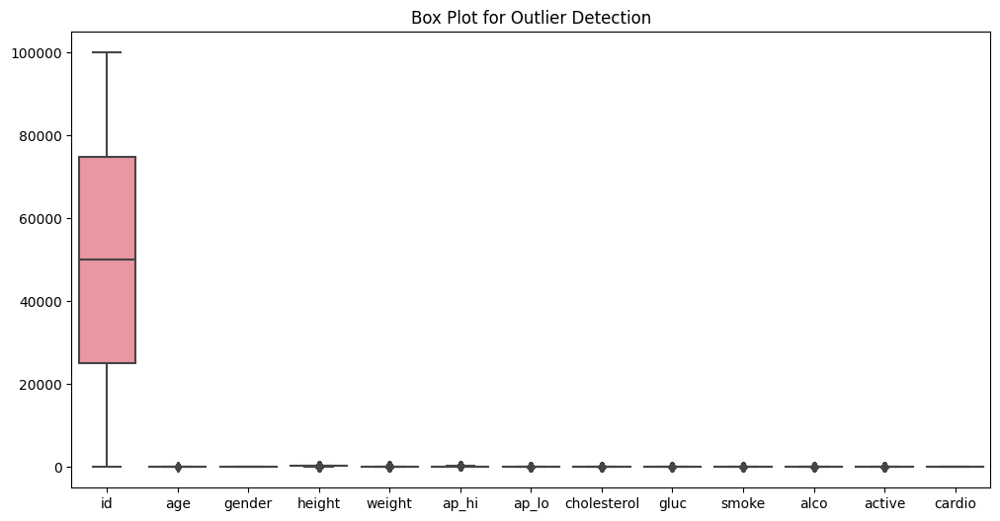

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(data=df)
plt.title('Box Plot for Outlier Detection')
plt.show()

Improved 'ap_hi' and 'ap_lo': The outliers in 'ap_hi' and 'ap_lo' have been significantly reduced or removed. This is a positive sign that you've addressed those potential issues.

Other Features: The other features seem to have relatively few outliers, indicating that your data is generally clean.

# Feature Engineering

In [20]:
df['BMI'] = df['weight'] / (df['height'] / 100) ** 2
df = df[(df['BMI'] > 10) & (df['BMI'] < 60)]


In [21]:
def bp_category(ap_hi, ap_lo):
    if ap_hi < 120 and ap_lo < 80:
        return 'Normal'
    elif 120 <= ap_hi <= 129 and ap_lo < 80:
        return 'Elevated'
    elif 130 <= ap_hi <= 139 or 80 <= ap_lo <= 89:
        return 'Hypertension Stage 1'
    elif 140 <= ap_hi <= 180 or 90 <= ap_lo <= 120:
        return 'Hypertension Stage 2'
    else:
        return 'Hypertensive Crisis'

df['bp_category'] = df.apply(lambda row: bp_category(row['ap_hi'], row['ap_lo']), axis=1)

In [22]:
print("BMI",df["BMI"].unique())
print("Bp category", df["bp_category"].unique())

BMI [21.96712018 34.92767916 23.50780533 ... 19.23018223 29.19412649
 50.47268066]
Bp category ['Hypertension Stage 1' 'Hypertension Stage 2' 'Normal' 'Elevated'
 'Hypertensive Crisis']


# BMI Distribution

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

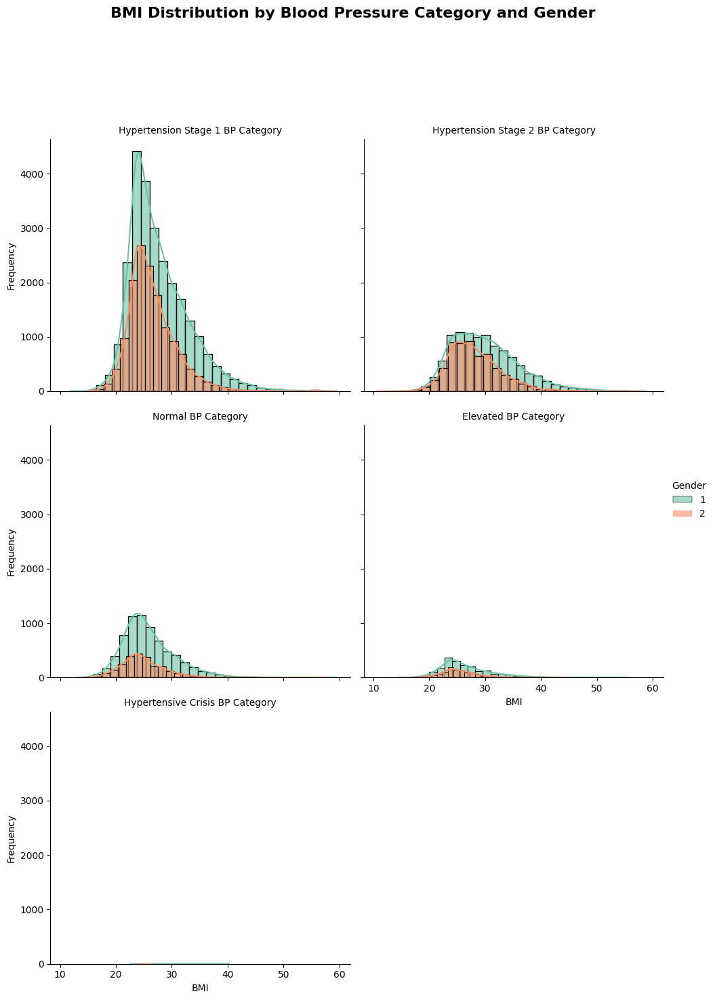

In [23]:
import seaborn as sns  
import matplotlib.pyplot as plt


g = sns.FacetGrid(df, col="bp_category", hue="gender", palette="Set2", height=5, aspect=1, col_wrap=2)
g.map(sns.histplot, "BMI", bins=30, kde=True, edgecolor="black", alpha=0.6)

# Add titles and a legend
g.add_legend(title="Gender")
g.set_axis_labels("BMI", "Frequency")
g.set_titles("{col_name} BP Category")

plt.subplots_adjust(top=0.85)
g.fig.suptitle('BMI Distribution by Blood Pressure Category and Gender', fontsize=16, weight='bold')

plt.show()

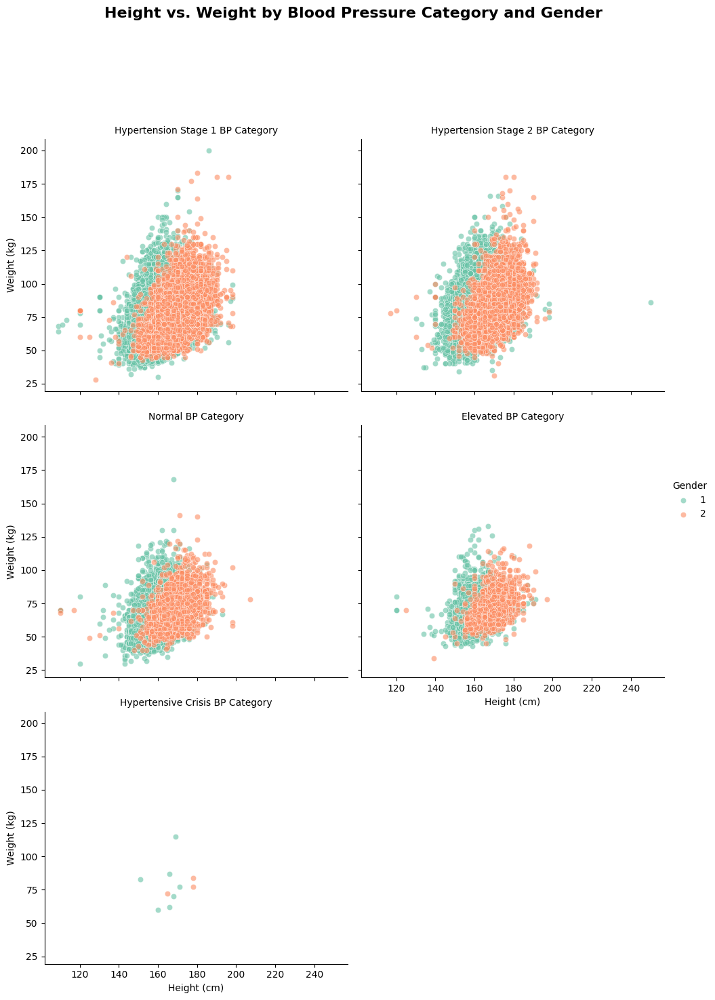

In [24]:
import seaborn as sns  
import matplotlib.pyplot as plt

g = sns.FacetGrid(df, col="bp_category", hue="gender", palette="Set2", height=5, aspect=1, col_wrap=2)
g.map(sns.scatterplot, "height", "weight", alpha=0.6, edgecolor="w")

g.add_legend(title="Gender")
g.set_axis_labels("Height (cm)", "Weight (kg)")
g.set_titles("{col_name} BP Category")

plt.subplots_adjust(top=0.85)
g.fig.suptitle('Height vs. Weight by Blood Pressure Category and Gender', fontsize=16, weight='bold')

plt.show()

# Blood Pressure Category

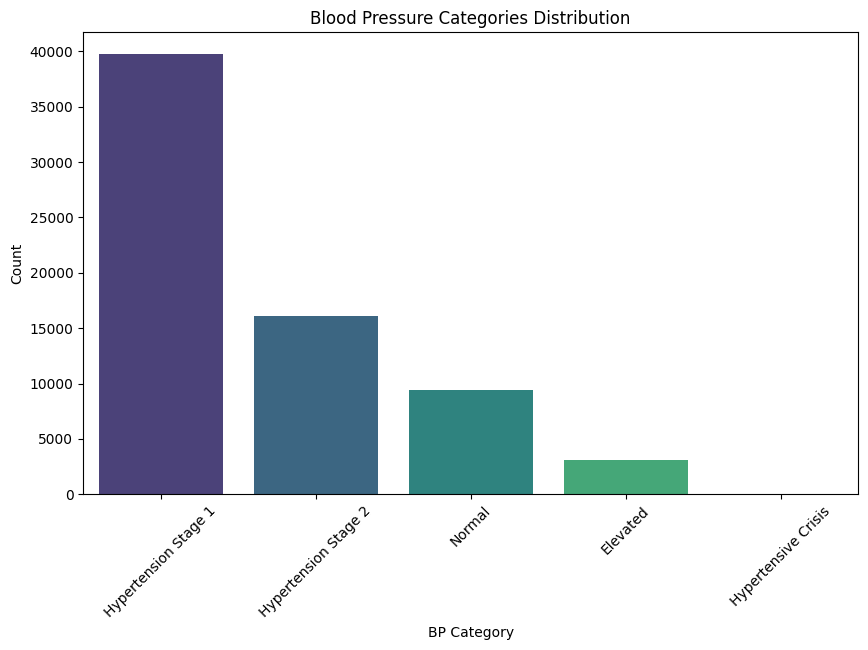

In [25]:
import seaborn as sns  
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='bp_category', palette='viridis')
plt.title('Blood Pressure Categories Distribution')
plt.xlabel('BP Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


Cholestrol and Blood Pressure

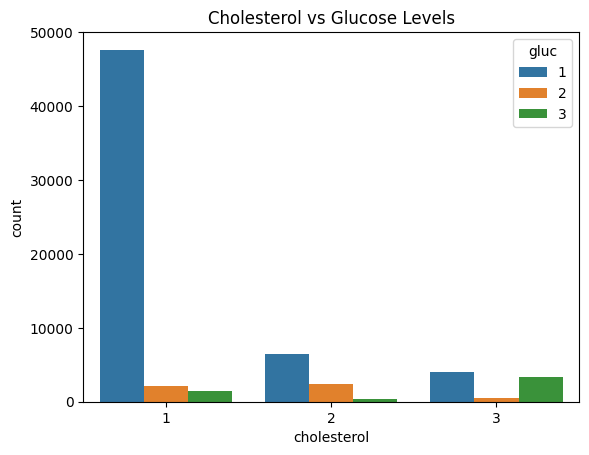

In [26]:
import seaborn as sns  
import matplotlib.pyplot as plt

sns.countplot(x='cholesterol', data=df, hue='gluc')
plt.title("Cholesterol vs Glucose Levels")
plt.show()


cardio and other factor

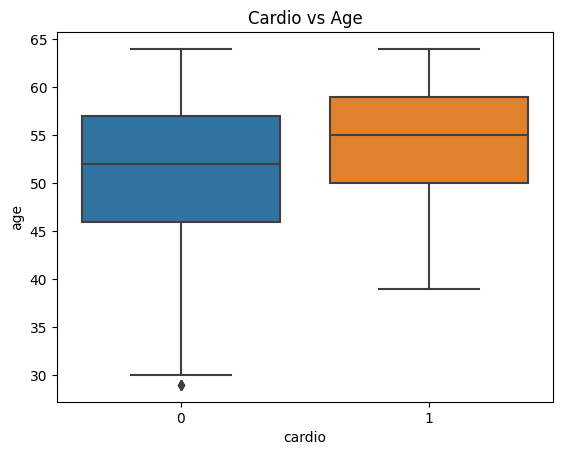

In [27]:
import seaborn as sns  
import matplotlib.pyplot as plt

sns.boxplot(x='cardio', y='age', data=df)
plt.title("Cardio vs Age")
plt.show()


Blood pressure vs Gender

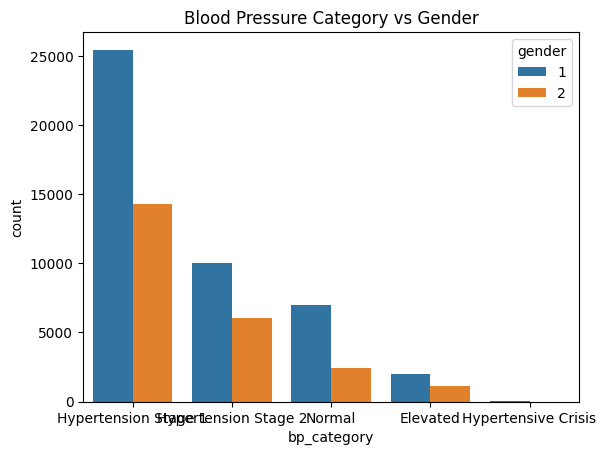

In [28]:
import seaborn as sns  
import matplotlib.pyplot as plt

sns.countplot(x='bp_category', data=df, hue='gender')
plt.title("Blood Pressure Category vs Gender")
plt.show()


Disease vs Activity

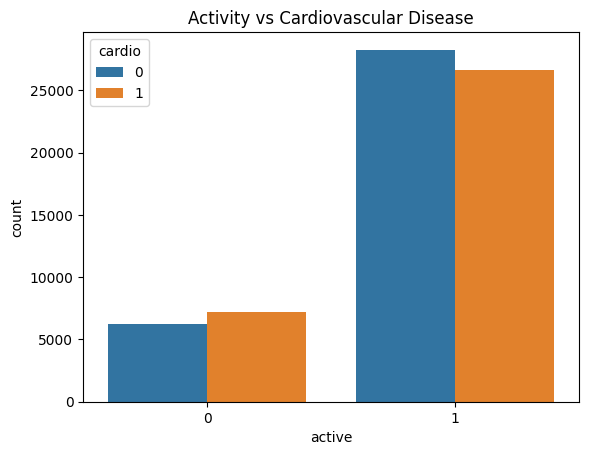

In [29]:
sns.countplot(x='active', data=df, hue='cardio')
plt.title("Activity vs Cardiovascular Disease")
plt.show()


# Correlation matrix

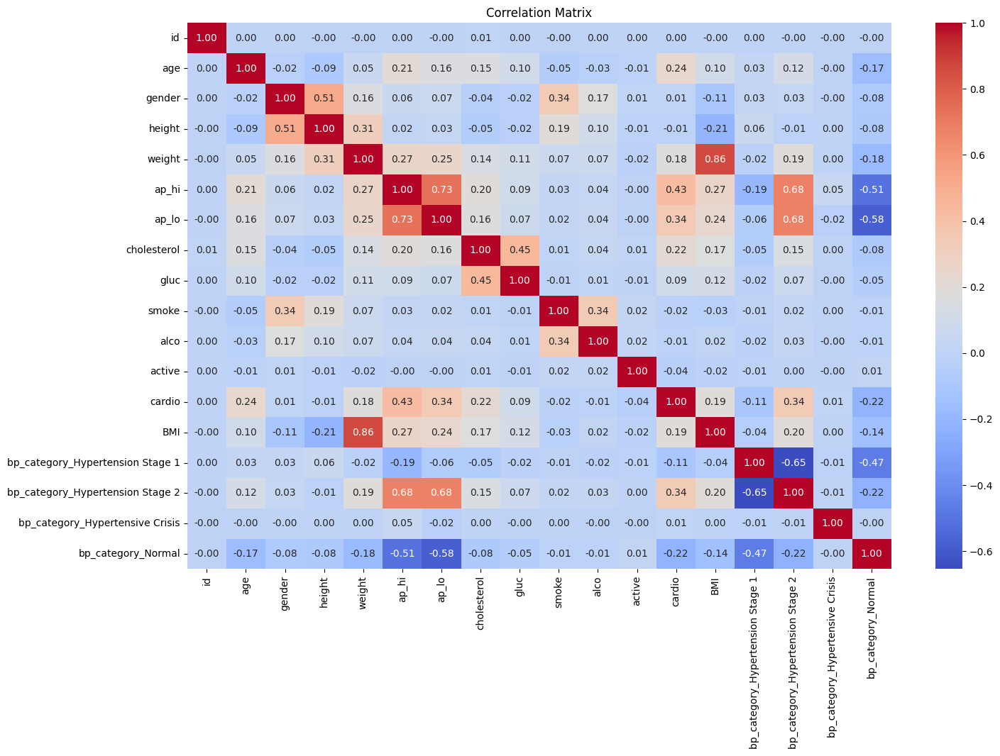

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

df_encoded = pd.get_dummies(df, drop_first=True) 
correlation_matrix = df_encoded.corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [31]:
numerical_variances = df.var(numeric_only=True)

print(numerical_variances)

id             8.321216e+08
age            4.574063e+01
gender         2.271515e-01
height         6.296227e+01
weight         2.013425e+02
ap_hi          2.678817e+02
ap_lo          8.499987e+01
cholesterol    4.609179e-01
gluc           3.268710e-01
smoke          8.011383e-02
alco           5.047150e-02
active         1.579436e-01
cardio         2.499768e-01
BMI            2.707427e+01
dtype: float64


- ID: High variance here is expected since IDs are unique identifiers and not typically useful in a predictive model.
- Age: Variance is moderate, suggesting a spread in ages within the dataset.
- Gender, Cholesterol, Gluc, Smoke, Alco, Active, Cardio: Low variance, which may be expected if these are binary or categorical variables (e.g., 0 or 1). Low variance in categorical features is common and generally not an issue.
- Height, Weight, BMI: Variance is somewhat high, indicating spread in these measurements, which is typical in health datasets.
- ap_hi (Systolic BP) and ap_lo (Diastolic BP): Variances are relatively high, which may warrant further investigation for outliers.

# Model Development

In [32]:
df.dtypes

id               int64
age              int64
gender           int64
height           int64
weight         float64
ap_hi            int64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
BMI            float64
bp_category     object
dtype: object

In [33]:
df.isnull().sum()

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
BMI            0
bp_category    0
dtype: int64

In [34]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, matthews_corrcoef, roc_auc_score, confusion_matrix
)
from sklearn.ensemble import (
    RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
)
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.preprocessing import StandardScaler

from tabulate import tabulate
import warnings
warnings.filterwarnings("ignore")

df.drop(columns=['id'], inplace=True)

categorical_cols = ['bp_category']
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

X = df.drop(columns=['cardio']) 
y = df['cardio']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  
X_test_scaled = scaler.transform(X_test)  

In [35]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(),
    "Support Vector Machine": SVC(),
    "Naive Bayes": GaussianNB(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "LightGBM": lgb.LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0), 
    "Decision Tree": DecisionTreeClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),




}

skf = StratifiedKFold(n_splits=5)


Training and evaluating Logistic Regression...
Training and evaluating Random Forest...
Training and evaluating Support Vector Machine...
Training and evaluating Naive Bayes...
Training and evaluating Gradient Boosting...
Training and evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 27073, number of negative: 27607
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 54680, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495117 -> initscore=-0.019532
[LightGBM] [Info] Start training from score -0.019532
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number 

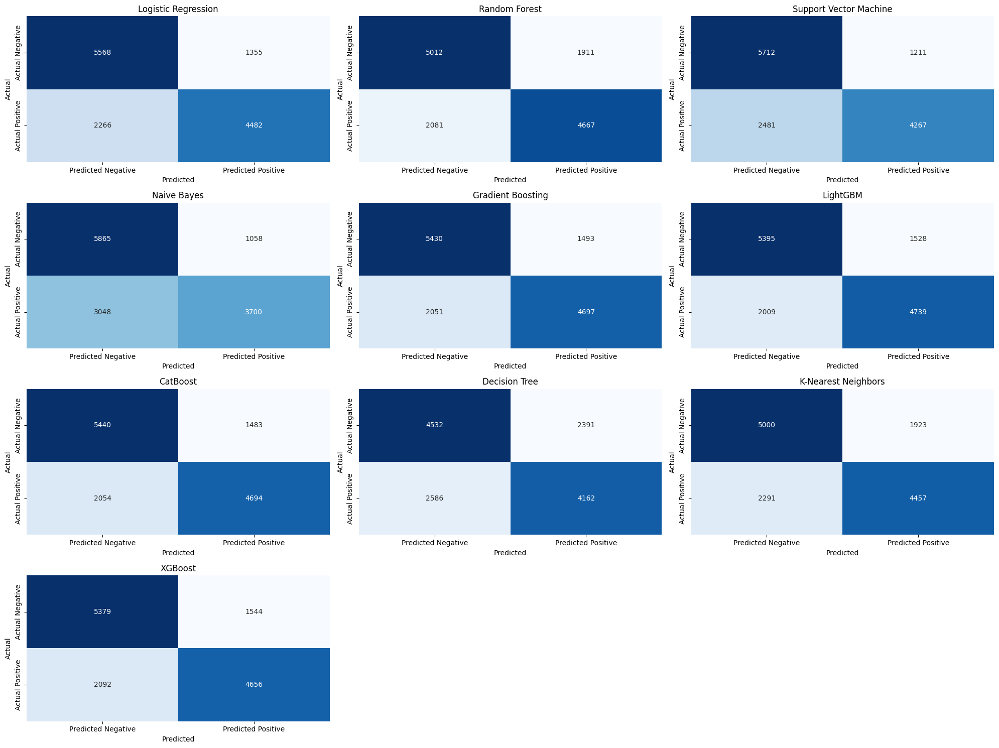

In [36]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    
    cv_score = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy').mean()
    
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    metrics = {
        'CV Accuracy': cv_score,
        'Test Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'MCC': matthews_corrcoef(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_prob) if y_prob is not None else 'N/A',
        'Confusion Matrix': confusion_matrix(y_test, y_pred).ravel()  # (tn, fp, fn, tp)
    }
    return metrics

results = {}

for model_name, model in models.items():
    print(f"Training and evaluating {model_name}...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results[model_name] = metrics
results_df = pd.DataFrame(results).T
results_df = results_df.sort_values(by='F1 Score', ascending=False)

print("\nModel Evaluation Results:")
print(tabulate(results_df, headers='keys', tablefmt='pretty'))

def plot_confusion_matrices(results, X_test, y_test):
    plt.figure(figsize=(20, 15))
    
    for i, (model_name, metrics) in enumerate(results.items()):
        cm = metrics['Confusion Matrix'].reshape(2, 2)
        plt.subplot(4, 3, i + 1)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                    xticklabels=['Predicted Negative', 'Predicted Positive'],
                    yticklabels=['Actual Negative', 'Actual Positive'])
        plt.title(model_name)
        plt.xlabel('Predicted')
        plt.ylabel('Actual')

    plt.tight_layout()
    plt.show()

plot_confusion_matrices(results, X_test, y_test)

- Summary of Models
Based on the results provided:

CatBoost and LightGBM are performing the best overall, with the highest CV and test accuracies, ROC-AUC scores, and reasonable precision and recall.
Logistic Regression also shows a good balance of precision and recall, although its accuracy is slightly lower than that of CatBoost and LightGBM.
AdaBoost, Random Forest, and Naive Bayes show decent performance but with lower ROC-AUC scores and F1 scores, indicating potential issues with either precision or recall.
KNN, SVC, and Decision Tree are among the lower performers, with KNN having the lowest overall metrics.

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 27073, number of negative: 27607
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 54680, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495117 -> initscore=-0.019532
[LightGBM] [Info] Start training from score -0.019532


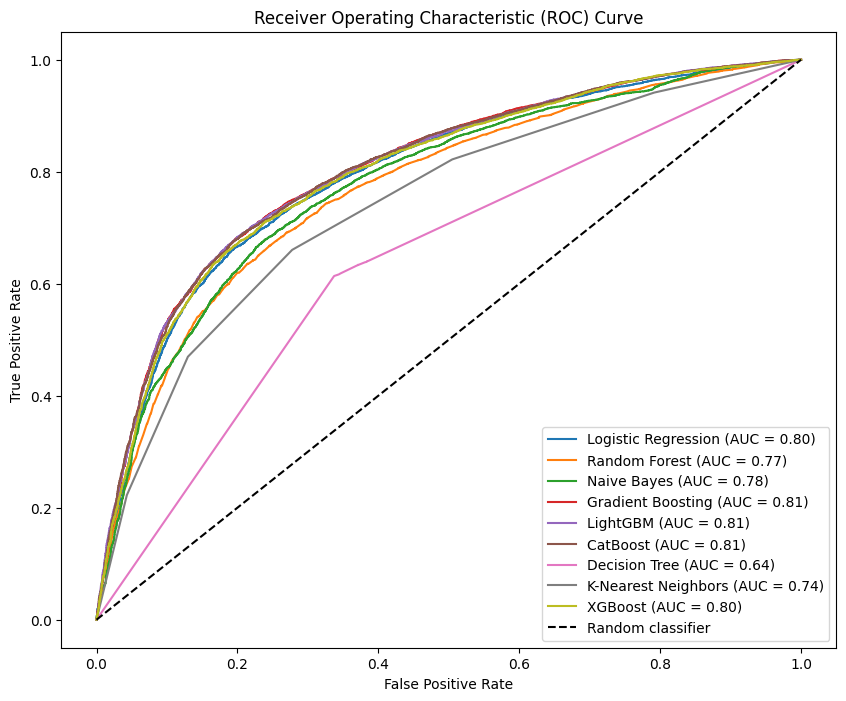

In [37]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 8))

for model_name, model in models.items():
    model.fit(X_train, y_train)
    
    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test)[:, 1]
        
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        auc_score = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (model_name, auc_score))
plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Hyperparameter tuning is crucial for optimizing machine learning models, as it helps find the best parameters that can improve the model's performance on unseen data. Here's a breakdown of why each of the selected models and their corresponding hyperparameters are important:

1. XGBoost
Why XGBoost?: XGBoost is a powerful gradient boosting framework known for its efficiency and performance. It often excels in competitions and practical applications due to its ability to handle large datasets and manage overfitting effectively.
Key Hyperparameters:
n_estimators: The number of boosting rounds; more trees can lead to better performance, but may also lead to overfitting.
max_depth: Controls the maximum depth of each tree, affecting model complexity.
learning_rate: Determines the step size at each iteration; a lower rate requires more trees but can improve performance.
subsample: The fraction of samples used for each tree, which helps prevent overfitting.
colsample_bytree: The fraction of features used for each tree, allowing for diversity among trees.
2. Logistic Regression
Why Logistic Regression?: It is a fundamental model for binary classification problems and serves as a good baseline. It is simple, interpretable, and effective for linearly separable data.
Key Hyperparameters:
C: The inverse of regularization strength; smaller values specify stronger regularization, which can prevent overfitting.
penalty: The type of regularization used (L1 or L2); choosing the right type can significantly impact performance.
solver: Different optimization algorithms can affect convergence speed and performance, making it essential to tune.
3. Support Vector Classifier (SVC)
Why SVC?: SVC is effective for high-dimensional spaces and is robust to overfitting, especially in cases where the number of dimensions exceeds the number of samples.
Key Hyperparameters:
C: Similar to logistic regression, it controls the trade-off between maximizing the margin and minimizing the classification error.
kernel: The kernel function (linear or RBF) allows for flexibility in decision boundaries.
gamma: A parameter for RBF kernel that defines how far the influence of a single training example reaches; tuning it can significantly affect model performance.
4. Random Forest
Why Random Forest?: This ensemble method improves prediction accuracy by combining multiple decision trees, reducing variance and improving robustness against overfitting.
Key Hyperparameters:
n_estimators: The number of trees in the forest; more trees generally improve performance.
max_depth: Limits the depth of each tree, controlling model complexity.
min_samples_split: The minimum number of samples required to split an internal node, which can prevent overfitting.
max_features: Controls the number of features to consider when looking for the best split; it can lead to more diverse trees.
5. AdaBoost
Why AdaBoost?: Adaptive Boosting combines multiple weak classifiers to create a strong classifier. It focuses on misclassified instances, making it effective for improving accuracy.
Key Hyperparameters:
n_estimators: The number of weak learners; more learners can increase performance but also lead to overfitting.
learning_rate: It controls the contribution of each classifier; a smaller learning rate may lead to better performance at the cost of increased training time.
6. Gradient Boosting
Why Gradient Boosting?: This model builds trees sequentially, with each tree correcting the errors of the previous ones. It is known for its flexibility and accuracy.
Key Hyperparameters:
n_estimators: The number of boosting stages; tuning is necessary to balance training time and accuracy.
max_depth: Similar to other tree-based models, it controls complexity.
learning_rate: Balances the contribution of each tree.
min_samples_split: Helps prevent overfitting by requiring a minimum number of samples to split.
7. MLP (Multi-layer Perceptron)
Why MLP?: MLP is a type of neural network that can capture complex relationships in the data, making it suitable for various tasks, including classification and regression.
Key Hyperparameters:
hidden_layer_sizes: Defines the number of neurons in the hidden layers; more neurons can increase model capacity.
activation: The activation function used in hidden layers affects how neurons respond to inputs.
solver: Different algorithms for optimizing weights, each with its advantages.
alpha: L2 regularization term that helps reduce overfitting.
learning_rate: Determines how quickly the model learns; tuning it is essential for convergence.
Conclusion
Choosing these models and hyperparameters provides a well-rounded approach to machine learning tasks, allowing you to capture different patterns in the data and optimize performance. By tuning these hyperparameters, you aim to achieve the best possible model for your specific dataset and classification problem. This comprehensive setup also enables comparisons across a variety of algorithms, helping you identify which one performs best under the given conditions.

To avoid fitting models multiple times when plotting the ROC-AUC curve, storing fitted models and access them for predictions. 

In [38]:
for model_name, model in models.items():
    model.fit(X_train, y_train)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 27073, number of negative: 27607
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 667
[LightGBM] [Info] Number of data points in the train set: 54680, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495117 -> initscore=-0.019532
[LightGBM] [Info] Start training from score -0.019532


After fitting, using the stored models to generate predictions for ROC-AUC plotting

In [39]:
import warnings
import optuna
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

warnings.filterwarnings('ignore', category=UserWarning)


XGBOOST

In [40]:
def objective_xgboost(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }
    model = XGBClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


LOGISTIC REGRESSION

In [41]:
def objective_logistic_regression(trial):
    params = {
        'C': trial.suggest_loguniform('C', 1e-4, 1e2),
        'penalty': trial.suggest_categorical('penalty', ['l1', 'l2']),
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga'])
    }
    model = LogisticRegression(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


SVC

In [42]:
def objective_svc(trial):
    params = {
        'C': trial.suggest_loguniform('C', 1e-4, 1e2),
        'kernel': trial.suggest_categorical('kernel', ['linear', 'rbf']),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto'])  
    }
    model = SVC(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


RANDOM FOREST

In [43]:
def objective_randomforest(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    }
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


ADABOOST

In [44]:
def objective_adaboost(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0)
    }
    model = AdaBoostClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


GRADIENTBOOSTING

In [45]:
def objective_gradientboosting(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20)
    }
    model = GradientBoostingClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


MLP

In [46]:
def objective_mlp(trial):
    params = {
        'hidden_layer_sizes': trial.suggest_int('hidden_layer_sizes', 50, 300),
        'activation': trial.suggest_categorical('activation', ['logistic', 'relu', 'tanh']),
        'solver': trial.suggest_categorical('solver', ['sgd', 'adam']),
        'alpha': trial.suggest_float('alpha', 1e-5, 1e-2),  # L2 regularization
        'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'adaptive'])
    }
    model = MLPClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)


Models Dictionary

In [47]:
models = {
    'XGBoost': objective_xgboost,
    'Logistic Regression': objective_logistic_regression,
    'SVC': objective_svc,
    'Random Forest': objective_randomforest,
    'AdaBoost': objective_adaboost,
    'Gradient Boosting': objective_gradientboosting,
    'MLP': objective_mlp
}

best_params = {}
for model_name, objective in models.items():
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=30)
    best_params[model_name] = (study.best_params, study.best_value)

for model_name, (params, score) in best_params.items():
    print(f"Best parameters for {model_name}: {params} with score: {score:.4f}")


[I 2024-11-14 17:06:34,531] A new study created in memory with name: no-name-8f99fe61-646b-4bc0-82f6-cbd3c0c92517
[I 2024-11-14 17:06:36,334] Trial 0 finished with value: 0.7370345987857508 and parameters: {'n_estimators': 316, 'max_depth': 6, 'learning_rate': 0.12093895608466816, 'subsample': 0.6783877465308974, 'colsample_bytree': 0.6520655829651257}. Best is trial 0 with value: 0.7370345987857508.
[I 2024-11-14 17:06:38,322] Trial 1 finished with value: 0.713554238899861 and parameters: {'n_estimators': 434, 'max_depth': 7, 'learning_rate': 0.2260441355236313, 'subsample': 0.6291267162860428, 'colsample_bytree': 0.6843429018398768}. Best is trial 0 with value: 0.7370345987857508.
[I 2024-11-14 17:06:39,286] Trial 2 finished with value: 0.7403262380220905 and parameters: {'n_estimators': 347, 'max_depth': 3, 'learning_rate': 0.1995916657788642, 'subsample': 0.5192777898857266, 'colsample_bytree': 0.7377419285508158}. Best is trial 2 with value: 0.7403262380220905.
[I 2024-11-14 17:06

Best parameters for XGBoost: {'n_estimators': 122, 'max_depth': 4, 'learning_rate': 0.05495206384540388, 'subsample': 0.7121472514480895, 'colsample_bytree': 0.5135259218608142} with score: 0.7429
Best parameters for Logistic Regression: {'C': 90.53294055867127, 'penalty': 'l2', 'solver': 'liblinear'} with score: 0.7359
Best parameters for SVC: {'C': 36.462393747087596, 'kernel': 'rbf', 'gamma': 'scale'} with score: 0.7348
Best parameters for Random Forest: {'n_estimators': 322, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 20, 'max_features': None} with score: 0.7419
Best parameters for AdaBoost: {'n_estimators': 98, 'learning_rate': 0.980969057881278} with score: 0.7390
Best parameters for Gradient Boosting: {'n_estimators': 211, 'max_depth': 4, 'learning_rate': 0.03471132437807176, 'min_samples_split': 14, 'min_samples_leaf': 18} with score: 0.7421
Best parameters for MLP: {'hidden_layer_sizes': 53, 'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0051435626365248

In [48]:
best_models = {}
for model_name, (params, score) in best_params.items():
    if model_name == 'XGBoost':
        best_models[model_name] = XGBClassifier(**params)
    elif model_name == 'Logistic Regression':
        best_models[model_name] = LogisticRegression(**params)
    elif model_name == 'SVC':
        best_models[model_name] = SVC(**params)
    elif model_name == 'Random Forest':
        best_models[model_name] = RandomForestClassifier(**params)
    elif model_name == 'AdaBoost':
        best_models[model_name] = AdaBoostClassifier(**params)
    elif model_name == 'Gradient Boosting':
        best_models[model_name] = GradientBoostingClassifier(**params)
    elif model_name == 'MLP':
        best_models[model_name] = MLPClassifier(**params)

results = {}
for model_name, model in best_models.items():
    print(f"Evaluating {model_name}...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results[model_name] = metrics

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values(by='F1 Score', ascending=False)

print("\nBest Model Evaluation Results:")
print(tabulate(results_df, headers='keys', tablefmt='pretty'))


Evaluating XGBoost...
Evaluating Logistic Regression...
Evaluating SVC...
Evaluating Random Forest...
Evaluating AdaBoost...
Evaluating Gradient Boosting...
Evaluating MLP...

Best Model Evaluation Results:
+---------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+-----------------------+
|                     |    CV Accuracy     |   Test Accuracy    |     Precision      |       Recall       |      F1 Score      |         MCC         |      ROC-AUC       |   Confusion Matrix    |
+---------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+-----------------------+
|  Gradient Boosting  | 0.7326444769568399 | 0.7420817789481384 | 0.7600904100742654 | 0.6976882039122703 |  0.72755370112811  | 0.4851429709138817  | 0.8059058655285197 | [5437 1486 2040 4708] |
|       X

# Implement a Stacking Ensemble

In [49]:
import numpy as np
import pandas as pd
from sklearn.ensemble import VotingClassifier, GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

base_estimators = [
    ('gradient_boosting', GradientBoostingClassifier()),
    ('xgboost', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ('random_forest', RandomForestClassifier()),
    ('ada_boost', AdaBoostClassifier())
]

voting_model = VotingClassifier(estimators=base_estimators, voting='soft')


In [50]:
voting_model.fit(X_train_scaled, y_train)
voting_score = voting_model.score(X_test_scaled, y_test)
print(f"Voting Model Accuracy: {voting_score}")


Voting Model Accuracy: 0.735937385706971


In [51]:
y_pred = voting_model.predict(X_test_scaled)


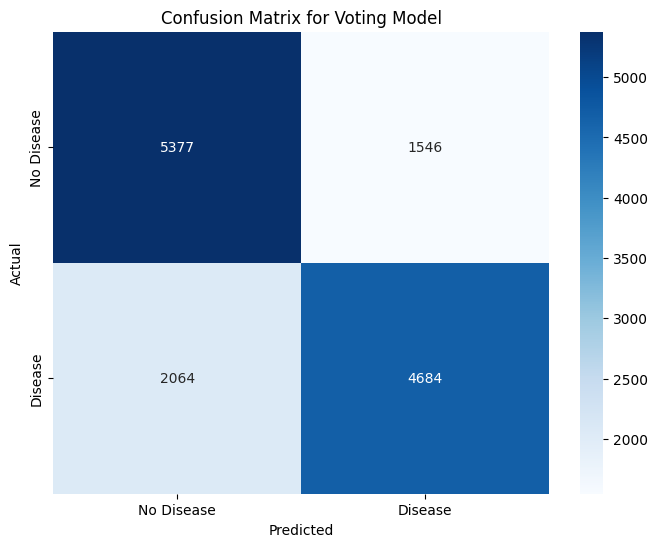

In [52]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Disease', 'Disease'], yticklabels=['No Disease', 'Disease'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Voting Model')
plt.show()


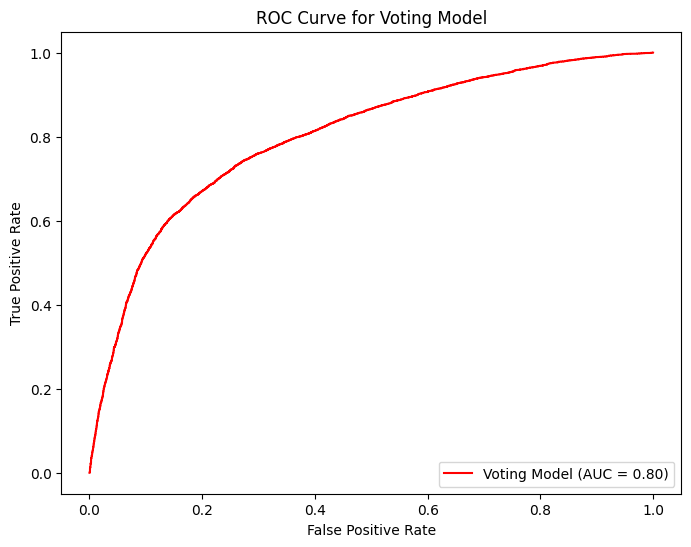

In [53]:
y_pred_prob = voting_model.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', label=f'Voting Model (AUC = {roc_auc:.2f})')  
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Voting Model')
plt.legend(loc='lower right')
plt.show()


Confusion Matrix for stacked model

- Confusion Matrix: Shows where the model performs well and where it may confuse classes. For example, if the stacked model has high values on the diagonal, it’s making accurate predictions.

Roc Curve for Stacked Model

- ROC Curve: Visualizes the model’s classification performance at various thresholds, indicating the trade-off between true positive and false positive rates. A high AUC suggests the stacked model effectively distinguishes between classes.

- Feature Importance: While the final stacked model (using logistic regression as a meta-estimator) doesn’t directly provide feature importance, each tree-based base model might. Visualizing these importances helps understand which features drive predictions in each model.

In [54]:
import joblib
joblib.dump(voting_model, 'voting_model_after_training.pkl')
print("Model saved as 'voting_model_after_training.pkl'.")


Model saved as 'voting_model_after_training.pkl'.


In [55]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=np.array(X_train_scaled),
    feature_names=X_train.columns,
    class_names=['No Disease', 'Disease'],
    mode='classification'
)


the LimeTabularExplainer is initialized with training data, feature names, class labels (No Disease and Disease), and the mode set to classification. This configuration allows LIME to interpret the features’ importance in predicting the presence or absence of disease.

In [56]:
class_1_indices = np.where(y_test == 1)[0]  
class_0_indices = np.where(y_test == 0)[0]   

sample_indices = np.concatenate((class_1_indices[:3], class_0_indices[:3]))


This section gathers a few representative samples from each class (in this case, three from each) for explanation.

In [57]:
for index in sample_indices:
    instance = X_test_scaled[index].reshape(1, -1)
    
    prediction = voting_model.predict(instance)
    print(f'Prediction for instance {index}: {prediction}') 

    exp = explainer.explain_instance(
        data_row=instance[0],
        predict_fn=voting_model.predict_proba
    )
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_explanation_{index}.html')


Prediction for instance 3: [1]


Prediction for instance 5: [0]


Prediction for instance 7: [0]


Prediction for instance 0: [0]


Prediction for instance 1: [0]


Prediction for instance 2: [0]


Each sample is extracted from X_test, reshaped, and then passed to the model for a prediction. Using LIME, we generate an explanation (exp) for each instance, which details the contribution of each feature to the model's prediction. The explanation is displayed directly in the notebook and saved as an HTML file.

Using LIME, we can gain clear insights into why our model made specific predictions. This step is crucial, as it enhances transparency and interpretability by showing which features most influenced each prediction, making it easier to trust and understand the model’s decisions

In [58]:
import joblib
joblib.dump(voting_model, 'voting_model.pkl')


['voting_model.pkl']

In [59]:
import numpy as np

random_index = np.random.choice(len(X_train_scaled), size=1, replace=False)
input_sample = X_train_scaled[random_index]

print("Randomly selected input sample:")
print(input_sample)

Randomly selected input sample:
[[-0.11754078 -0.7302929   1.71353531  0.27637459 -0.40692423 -0.14618237
  -0.53826464 -0.39603616 -0.31098982 -0.23901684 -2.01894113 -0.54353396
   0.84577973 -0.55430885 -0.01283048 -0.3988898 ]]
